<a href="https://colab.research.google.com/github/slachitoff/CS-GY-6613-Assignments/blob/main/CS_GY_6613_Mid_Term_Problem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Problem 1: Take at Home  (45 points)
### Introduction
Typically when we train a Convolutional Neural Network as an end-to-end image classifier, we input an image to the network, which gets propagated through the network (feed forward).

We then obtain our posterior probabilities at the end of the network.

However, there is no “rule” that says we must allow the image to forward propagate through the entire network that includes the head. Instead, we can:

1) Stop propagation at a layer before the head of the network (such as an activation or pooling layer).

2) Extract the logits at this layer.

3) Treat the values as a feature vector.

Now these feature vectors can be utilized in other downstream tasks like classification. Our aim is to create a system where an input query image will be responded by a number of  images that have strong resemblance to the query image. This particular task is called **similarity search**. A naive way to perform this task, would be to compare images based on pixel values, patches, or some other high level feature taken from the image itself. You are askd to use the ResNet-50 architecture to produce features that can represent a concept aka a face with specific characteristics. 

### Part 1 Loading of Dataset in Colab (5 points)

Create a jupyter notebook (eg on Google Colab) and download the LFW dataset, from [here](http://vis-www.cs.umass.edu/lfw/).

You can manually download the dataset using the above link and then upload to colab or altelnatively you can issue in colab the commands shown below:

In [ ]:
!wget http://vis-www.cs.umass.edu/lfw/lfw.tgz
!tar -xvf /content/lfw.tgz
# %rm -rf lfw
# %rm -rf imgDir

Streaming output truncated to the last 5000 lines.
lfw/Luis_Sanchez/
lfw/Luis_Sanchez/Luis_Sanchez_0001.jpg
lfw/Juliette_Binoche/
lfw/Juliette_Binoche/Juliette_Binoche_0001.jpg
lfw/Joel_Todd/
lfw/Joel_Todd/Joel_Todd_0001.jpg
lfw/Allan_Wagner/
lfw/Allan_Wagner/Allan_Wagner_0001.jpg
lfw/Alejandro_Fernandez/
lfw/Alejandro_Fernandez/Alejandro_Fernandez_0001.jpg
lfw/Guillaume_Depardieu/
lfw/Guillaume_Depardieu/Guillaume_Depardieu_0001.jpg
lfw/Delphine_Chuillot/
lfw/Delphine_Chuillot/Delphine_Chuillot_0001.jpg
lfw/Paul_LeClerc/
lfw/Paul_LeClerc/Paul_LeClerc_0001.jpg
lfw/Eddie_Jordan/
lfw/Eddie_Jordan/Eddie_Jordan_0001.jpg
lfw/Lionel_Richie/
lfw/Lionel_Richie/Lionel_Richie_0001.jpg
lfw/Lionel_Richie/Lionel_Richie_0002.jpg
lfw/Jose_Viegas_Filho/
lfw/Jose_Viegas_Filho/Jose_Viegas_Filho_0001.jpg
lfw/Jose_Viegas_Filho/Jose_Viegas_Filho_0002.jpg
lfw/Roger_Mahony/
lfw/Roger_Mahony/Roger_Mahony_0001.jpg
lfw/Clay_Aiken/
lfw/Clay_Aiken/Clay_Aiken_0001.jpg
lfw/Clay_Aiken/Clay_Aiken_0002.jpg
lfw/Clay_Ai


### Part 2 Using CNN for Feature Extraction (25 points)

Use ResNet50 to extract features vectors from raw images. You can use TF or Pytorch APIs to: 

* Obtain a ResNet-50  model pre-trained on a dataset such as ImageNet. 
* Perform necessary preprocessing on the images before feeding them into the network.
* Extract the features from the penultimate layer of the network (before the fully connected layer - the classification head).
* Store the features in a dictionary, where the key is the name of the image and the value is the feature vector.

### Part 3 Retrieving most similar images (15 points)

Use a nearest neighbor algorithm such as [this](https://scikit-learn.org/stable/modules/neighbors.html) to obtain the 10 most similar images to 5 query images of your choice. Choose the results that best illustrate the effectiveness of your system. 


In [ ]:
import tarfile
tarFolder = tarfile.open('/content/lfw.tgz') 
tarFolder.extractall()
tarFolder.close()

In [ ]:
import torch
import os
import matplotlib.pyplot as plt 
from os.path import isfile, join
from PIL import Image
from torchvision.models import resnet50, ResNet50_Weights
from torchvision import transforms
from sklearn.neighbors import NearestNeighbors
import numpy as np
resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
lastLayer = torch.nn.Sequential(*list(resnet.children())[:-2])
lastLayer.eval()

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean = [0.485, 0.456, 0.406],
        std = [.229, 0.224, 0.225]
    )
])

imgDict = {}
dictKeys = []
featureList = []
torch.set_grad_enabled(False)
for path, subdirs, files in os.walk('/content/lfw'):
    for name in files:
      imgPath=os.path.join(path, name)
      dictKeys.append(imgPath)
      img = Image.open(imgPath)
      proImg = preprocess(img)
      tensorImg = torch.unsqueeze(proImg, 0)
      imgFeatures = lastLayer(tensorImg)
      imgFeatures = imgFeatures.squeeze().detach().numpy().flatten()
      featureList.append(imgFeatures)
      imgDict[name] = imgFeatures

nearestNeighbor = NearestNeighbors(n_neighbors=11, algorithm='ball_tree').fit(featureList)

Bill_Gates.jpg


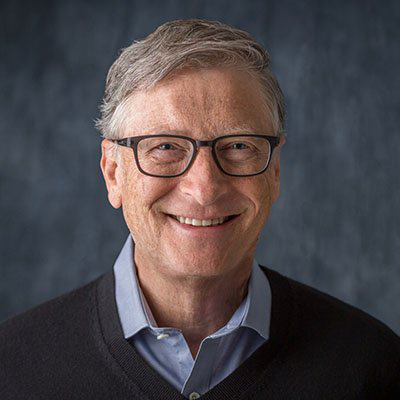

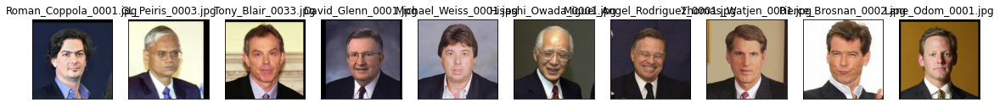

Patrick_Stewart.jpg


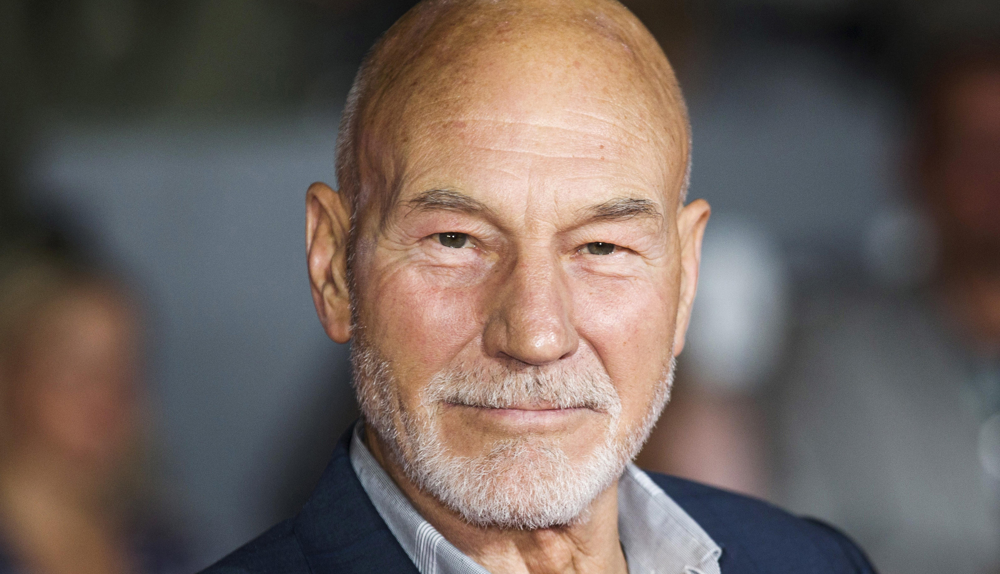

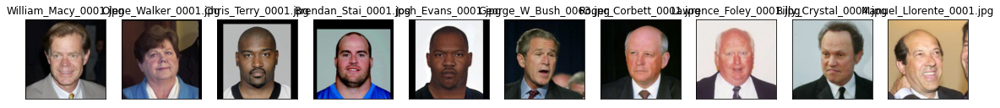

Simone Biles.jpeg


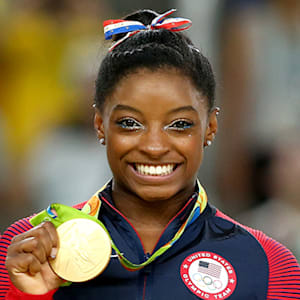

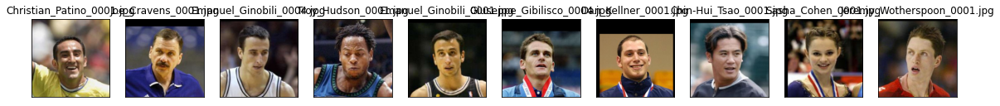

Britney_Spears.jpg


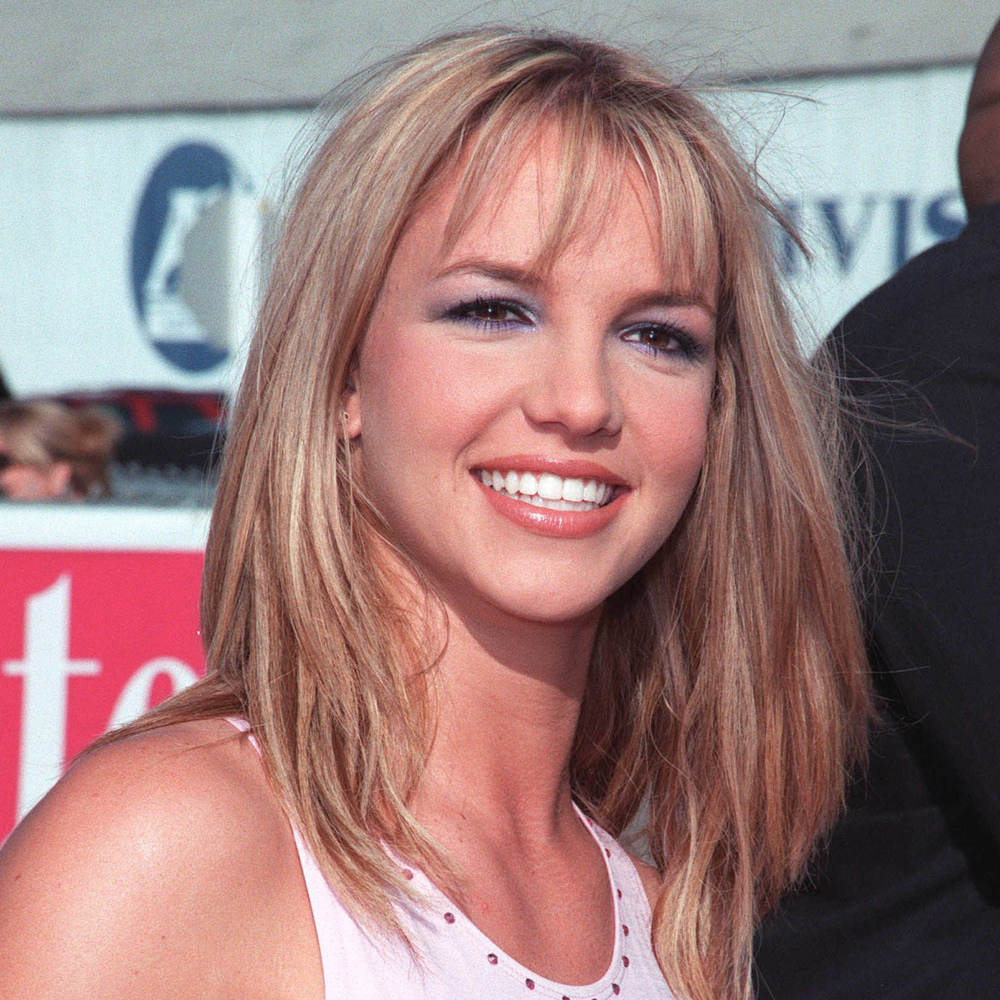

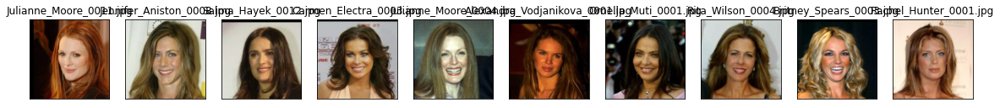

Derek_Jeter.jpg


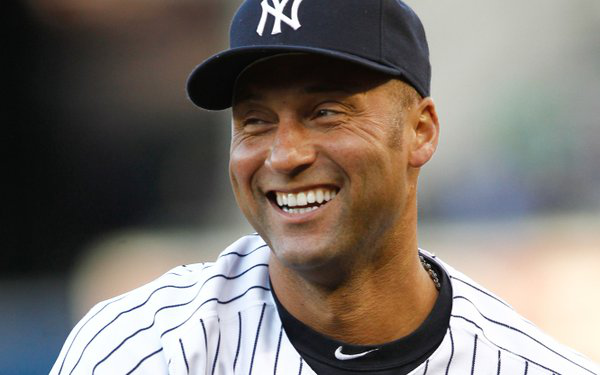

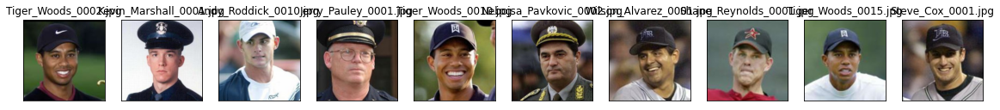

In [ ]:
searchImgs = ['/content/Bill_Gates.jpg', '/content/Patrick_Stewart.jpg', '/content/Simone Biles.jpeg', '/content/Britney_Spears.jpg', '/content/Derek_Jeter.jpg']

for image in searchImgs:
  print(image.split('/')[-1])
  searchImg = Image.open(os.path.join(image)).convert('RGB')
  searchImg.show()
  proSearchImg = preprocess(searchImg)
  searchTensor = torch.unsqueeze(proSearchImg, 0)
  searchFeatures = lastLayer(searchTensor).squeeze().detach().numpy()
  searchFeatures = searchFeatures.reshape(1, -1)
  distances, indices = nearestNeighbor.kneighbors(searchFeatures)
  fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(20, 4))
  counter = 0
  for i in indices[0][1:]:
    closeMatch = Image.open(dictKeys[i])
    axes[counter].imshow(closeMatch)
    axes[counter].set_xticks([])
    axes[counter].set_yticks([])
    imgName = dictKeys[i].split('/')[-1]
    axes[counter].set_title(imgName)
    counter += 1
  plt.show()
